# Fake Diffusion

这里我们来真正意思上的实现一个假的diffusion。

![demo8](image/demo8_fake_diffusion.gif)

In [1]:
from PIL import Image

# 读取图片
image_path = "image/687987.jpg"  # 替换为实际的图片路径
input_image = Image.open(image_path)

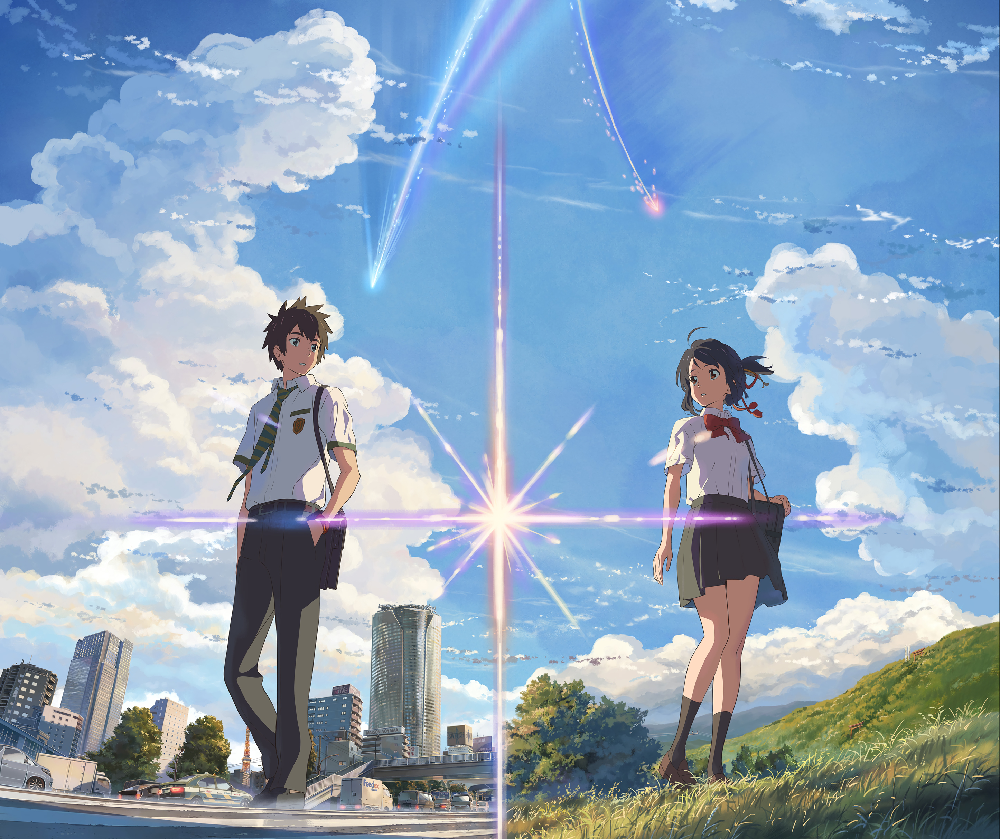

In [2]:
input_image

In [3]:
import numpy as np

# 将图片转换为numpy数组 
input_array = np.asarray(input_image)

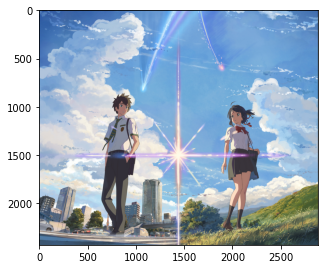

In [7]:
import matplotlib.pyplot as plt

# 显示图片
plt.figure(figsize=(5, 5))
plt.imshow(input_array)
plt.show()

In [28]:
def gennerateImage(eps = 1e-1, input_array = input_array):
    mask = np.random.random(input_array.shape)
    mask = (mask * 2 - 1) * 128 + 128 # 将mask的值转换为-1到1之间
    noise_img = (input_array * (1 - eps) + mask * eps).astype(np.uint8) % 255
    return noise_img

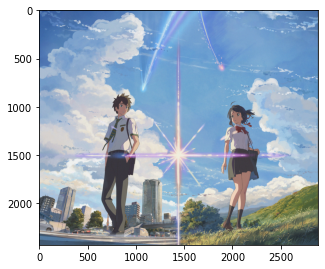

In [29]:
# 显示noise_img
plt.figure(figsize=(5, 5))
plt.imshow(gennerateImage())
plt.show()

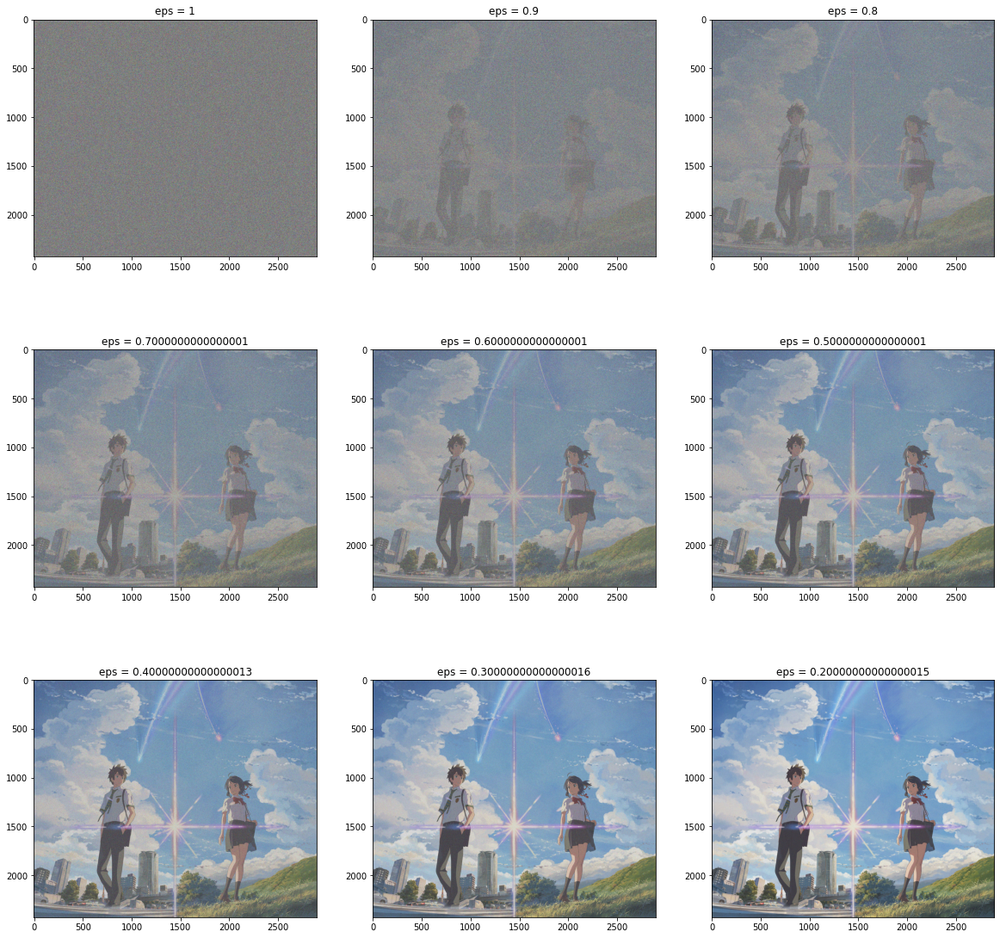

In [31]:
# 生成多张图片
plt.figure(figsize=(20, 20))
eps = 1
for i in range(1,10):
    plt.subplot(3, 3, i)
    plt.imshow(gennerateImage(eps, input_array))
    plt.title("eps = {}".format(eps))
    eps -= 0.1
plt.show()

In [33]:
import gradio as gr
import numpy as np
import time

# define core fn, which returns a generator {steps} times before returning the image
def fake_diffusion(img,steps):
    eps=1
    for _ in range(steps):
        time.sleep(0.1)
        eps = eps - 0.1
        image = gennerateImage(eps, img)
        yield image

demo = gr.Interface(
    fake_diffusion, 
    inputs=["image",gr.inputs.Slider(1, 10, 1, default=5)],
    outputs="image",
    title="Fake Diffusion",
    examples=[["image/687987.jpg"]],
)

# define queue - required for generators
demo.queue()

demo.launch()


d:\anaconda\lib\site-packages\gradio\inputs.py:89: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
d:\anaconda\lib\site-packages\gradio\inputs.py:93: UserWarning: `optional` parameter is deprecated, and it has no effect
  super().__init__(


Running on local URL:  http://127.0.0.1:7872

To create a public link, set `share=True` in `launch()`.


Traceback (most recent call last):
  File "d:\anaconda\lib\site-packages\gradio\routes.py", line 437, in run_predict
    output = await app.get_blocks().process_api(
  File "d:\anaconda\lib\site-packages\gradio\blocks.py", line 1352, in process_api
    result = await self.call_function(
  File "d:\anaconda\lib\site-packages\gradio\blocks.py", line 1093, in call_function
    prediction = await utils.async_iteration(iterator)
  File "d:\anaconda\lib\site-packages\gradio\utils.py", line 341, in async_iteration
    return await iterator.__anext__()
  File "d:\anaconda\lib\site-packages\gradio\interface.py", line 636, in fn
    async for output in iterator:
  File "d:\anaconda\lib\site-packages\gradio\utils.py", line 334, in __anext__
    return await anyio.to_thread.run_sync(
  File "d:\anaconda\lib\site-packages\anyio\to_thread.py", line 31, in run_sync
    return await get_asynclib().run_sync_in_worker_thread(
  File "d:\anaconda\lib\site-packages\anyio\_backends\_asyncio.py", line 937, 